## Modelling and Data Analysis – Exercise 4, Task 2

In [129]:
# Packages
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.colors import TwoSlopeNorm
from scipy.stats import ttest_1samp

In [1]:
# Importing all the files
FourxCO2_2D = xr.open_dataset("data/amip-mda025-short-vsc5-student08-11y-4xco2_atm_2d_ml_ALLTIME.nc")
FourxCO2_3D = xr.open_dataset("data/amip-mda025-short-vsc5-student08-11y-4xco2_atm_3d_ml_ALLTIME.nc")

SSTFourK_2D = xr.open_dataset("data/amip-mda025-short-vsc5-student08-11y-sst4K_atm_2d_ml_ALLTIME.nc")
SSTFourK_3D = xr.open_dataset("data/amip-mda025-short-vsc5-student08-11y-sst4K_atm_3d_ml_ALLTIME.nc")

Ref_2D = xr.open_dataset("data/amip-mda025-short-vsc5-student08-11y-reference_atm_2d_ml_ALLTIME.nc")
Ref_3D = xr.open_dataset("data/amip-mda025-short-vsc5-student08-11y-reference_atm_3d_ml_ALLTIME.nc")

NameError: name 'xr' is not defined

In [131]:
# ATTENTION: Only run once!
# Changing the temporal dimension from float YYYYMMDD to string YYYY-MM-DD -> there are some difficulties otherwise

# 4x CO2 2D
date_floats = FourxCO2_2D["time"].values
date_strs = [str(int(d)) for d in date_floats]
date_iso = [f"{d[:4]}-{d[4:6]}-{d[6:]}" for d in date_strs]
date_dt = pd.to_datetime(date_iso)
FourxCO2_2D = FourxCO2_2D.assign_coords(time=date_dt)

# 4x CO2 3D
date_floats = FourxCO2_3D["time"].values
date_strs = [str(int(d)) for d in date_floats]
date_iso = [f"{d[:4]}-{d[4:6]}-{d[6:]}" for d in date_strs]
date_dt = pd.to_datetime(date_iso)
FourxCO2_3D = FourxCO2_3D.assign_coords(time=date_dt)

# SST +4K 2D
date_floats = SSTFourK_2D["time"].values
date_strs = [str(int(d)) for d in date_floats]
date_iso = [f"{d[:4]}-{d[4:6]}-{d[6:]}" for d in date_strs]
date_dt = pd.to_datetime(date_iso)
SSTFourK_2D = SSTFourK_2D.assign_coords(time=date_dt)

# SST +4K 3D
date_floats = SSTFourK_3D["time"].values
date_strs = [str(int(d)) for d in date_floats]
date_iso = [f"{d[:4]}-{d[4:6]}-{d[6:]}" for d in date_strs]
date_dt = pd.to_datetime(date_iso)
SSTFourK_3D = SSTFourK_3D.assign_coords(time=date_dt)

# Reference 2D
date_floats = Ref_2D["time"].values
date_strs = [str(int(d)) for d in date_floats]
date_iso = [f"{d[:4]}-{d[4:6]}-{d[6:]}" for d in date_strs]
date_dt = pd.to_datetime(date_iso)
Ref_2D = Ref_2D.assign_coords(time=date_dt)

# Reference 3D
date_floats = Ref_3D["time"].values
date_strs = [str(int(d)) for d in date_floats]
date_iso = [f"{d[:4]}-{d[4:6]}-{d[6:]}" for d in date_strs]
date_dt = pd.to_datetime(date_iso)
Ref_3D = Ref_3D.assign_coords(time=date_dt)

In [132]:
# ATTENTION: Only run once!
# Dropping the first year

CO2_2D = FourxCO2_2D.isel(time=slice(12, None))
CO2_3D = FourxCO2_3D.isel(time=slice(12, None))

SST_2D = SSTFourK_2D.isel(time=slice(12, None))
SST_3D = SSTFourK_3D.isel(time=slice(12, None))

Ref_2D = Ref_2D.isel(time=slice(12, None))
Ref_3D = Ref_3D.isel(time=slice(12, None))

In [133]:
# Calculating the temporal means (including weights)

# 4x CO2 3D
month_length = CO2_3D.time.dt.days_in_month
temporal_weights = month_length / month_length.sum()
CO2_3D_temporal_mean = CO2_3D.weighted(temporal_weights).mean(dim="time")
# CO2_3D_temporal_mean.to_netcdf("CO2_3D_temporal_mean.nc")

# SST +4K 3D
month_length = SST_3D.time.dt.days_in_month
temporal_weights = month_length / month_length.sum()
SST_3D_temporal_mean = SST_3D.weighted(temporal_weights).mean(dim="time")
# SST_3D_temporal_mean.to_netcdf("SST_3D_temporal_mean.nc")

# Reference 3D
month_length = Ref_3D.time.dt.days_in_month
temporal_weights = month_length / month_length.sum()
Ref_3D_temporal_mean = Ref_3D.weighted(temporal_weights).mean(dim="time")
# Ref_3D_temporal_mean.to_netcdf("Ref_3D_temporal_mean.nc")

In [134]:
# Calculating the zonal mean of the 3D cloud fraction
cl = CO2_3D_temporal_mean["cl"]
CO2_3D_temporal_mean_cl = cl.groupby("clat").mean(dim="ncells")

cl = SST_3D_temporal_mean["cl"]
SST_3D_temporal_mean_cl = cl.groupby("clat").mean(dim="ncells")

cl = Ref_3D_temporal_mean["cl"]
Ref_3D_temporal_mean_cl = cl.groupby("clat").mean(dim="ncells")

In [7]:
# ATTENTION: Only run once!
# Changing the coordinates from radians to degree

#CO2_3D_temporal_mean_cl = CO2_3D_temporal_mean_cl.assign_coords(clat=np.rad2deg(CO2_3D_temporal_mean_cl["clat"]))
#SST_3D_temporal_mean_cl = SST_3D_temporal_mean_cl.assign_coords(clat=np.rad2deg(SST_3D_temporal_mean_cl["clat"]))
#Ref_3D_temporal_mean_cl = Ref_3D_temporal_mean_cl.assign_coords(clat=np.rad2deg(Ref_3D_temporal_mean_cl["clat"]))

In [135]:
# ---------------------------------------------------------------
# Only ttest
# ---------------------------------------------------------------

def weighted_annual_mean(ds):
    month_length = ds.time.dt.days_in_month
    weighted_sum = (ds * month_length).groupby("time.year").sum("time")
    normalization = month_length.groupby("time.year").sum("time")
    return weighted_sum / normalization

ttest_CO2_3D_ann = weighted_annual_mean(CO2_3D)
ttest_SST_3D_ann = weighted_annual_mean(SST_3D)
ttest_Ref_3D_ann = weighted_annual_mean(Ref_3D)

# Calculating the zonal mean of the 3D cloud fraction
cl = ttest_CO2_3D_ann["cl"]
ttest_CO2_3D_temporal_mean_cl = cl.groupby("clat").mean(dim="ncells")

cl = ttest_SST_3D_ann["cl"]
ttest_SST_3D_temporal_mean_cl = cl.groupby("clat").mean(dim="ncells")

cl = ttest_Ref_3D_ann["cl"]
ttest_Ref_3D_temporal_mean_cl = cl.groupby("clat").mean(dim="ncells")

dCO2 = ttest_CO2_3D_temporal_mean_cl - ttest_Ref_3D_temporal_mean_cl
dSST = ttest_SST_3D_temporal_mean_cl - ttest_Ref_3D_temporal_mean_cl

tval_co2, pval_co2 = ttest_1samp(dCO2, popmean=0, axis=0)
tval_sst, pval_sst = ttest_1samp(dSST, popmean=0, axis=0)


# ------
signal_co2 = dCO2.mean(dim="year")
sig_mask_co2=pval_co2>=0.05

signal_sst = dSST.mean(dim="year")
sig_mask_sst=pval_sst>=0.05

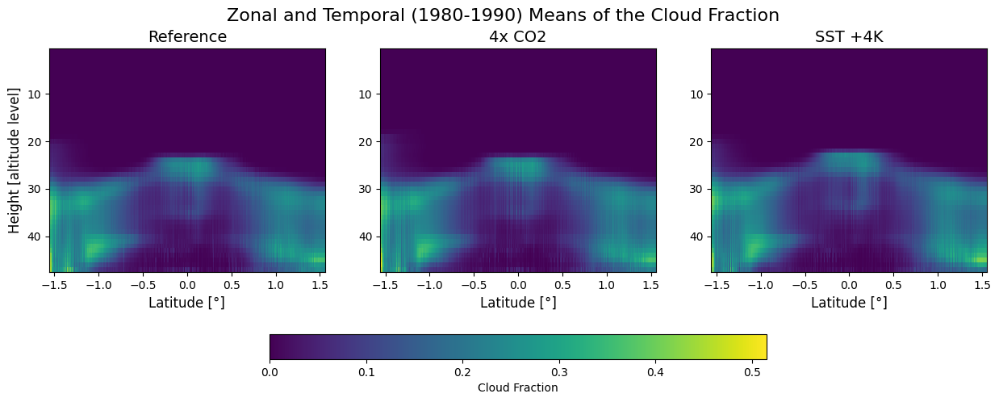

In [136]:
# ---------------------------------------------------------------
# Plot of all three scenarios – cloud fraction
# ---------------------------------------------------------------

arrays3d = [Ref_3D_temporal_mean_cl, CO2_3D_temporal_mean_cl, SST_3D_temporal_mean_cl]
names = ["Reference", "4x CO2", "SST +4K"]

fig, ax = plt.subplots(figsize=(15, 5), nrows=1, ncols=3)

# For the global colorbar
vmin = min(arr.min().values for arr in arrays3d)
vmax = max(arr.max().values for arr in arrays3d)

for i in range(0,3):
    pcm = ax[i].pcolormesh(
        arrays3d[i].clat, arrays3d[i].height, arrays3d[i],
        shading='auto',
        cmap='viridis',
        vmin=vmin,
        vmax=vmax
    )

    ax[i].invert_yaxis()
    ax[i].set_title(names[i], fontsize=14)
    ax[i].set_xlabel("Latitude [°]", fontsize=12)

ax[0].set_ylabel("Height [altitude level]", fontsize=12)

fig.suptitle("Zonal and Temporal (1980-1990) Means of the Cloud Fraction", fontsize=16)
fig.colorbar(pcm, ax=ax, orientation='horizontal', label="Cloud Fraction", fraction=0.08, pad=0.2)

plt.show()

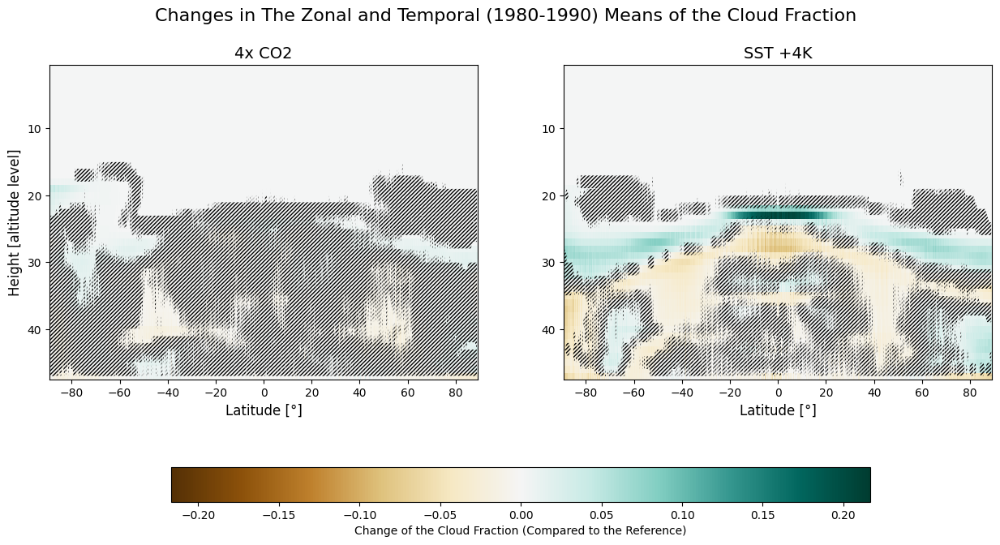

In [137]:
# ---------------------------------------------------------------
# Plot of the differences comparing 4x CO2 and SST +4K to the reference
# ---------------------------------------------------------------

arrays3d = [CO2_3D_temporal_mean_cl-Ref_3D_temporal_mean_cl, SST_3D_temporal_mean_cl-Ref_3D_temporal_mean_cl]
names = ["4x CO2", "SST +4K"]

"""tval_co2, pval_co2 = ttest_1samp(arrays3d[0], popmean=0, axis=0)
sig_mask_co2=pval_co2>=0.05

tval_sst, pval_sst = ttest_1samp(arrays3d[1], popmean=0, axis=0)
sig_mask_sst=pval_sst>=0.05"""


fig, ax = plt.subplots(figsize=(15, 7), nrows=1, ncols=2)

# For the global colorbar
vmin = min(arr.min().values for arr in arrays3d)
vmax = max(arr.max().values for arr in arrays3d)
norm = TwoSlopeNorm(vmin=-np.max([np.abs(vmin),np.absolute(vmax)]), vcenter=0, vmax=np.max([np.abs(vmin),np.absolute(vmax)]))
#norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)

for i in range(0,2):

    pcm = ax[i].pcolormesh(
        np.rad2deg(arrays3d[i].clat), arrays3d[i].height, arrays3d[i],
        shading='auto',
        cmap='BrBG',
        norm=norm,
    )

    ax[i].invert_yaxis()
    ax[i].set_title(names[i], fontsize=14)
    ax[i].set_xlabel("Latitude [°]", fontsize=12)

# Plot of the ttest
ax[0].contourf(np.rad2deg(signal_co2.clat), signal_co2.height, sig_mask_co2, levels=[0.05,1], colors='none', hatches=["///////"])
ax[1].contourf(np.rad2deg(signal_sst.clat), signal_sst.height, sig_mask_sst, levels=[0.05,1], colors='none', hatches=["///////"])

ax[0].set_ylabel("Height [altitude level]", fontsize=12)

fig.suptitle("Changes in The Zonal and Temporal (1980-1990) Means of the Cloud Fraction", fontsize=16)
fig.colorbar(pcm, ax=ax, orientation='horizontal', label="Change of the Cloud Fraction (Compared to the Reference)", fraction=0.08, pad=0.2)

plt.savefig("Zonal_TotalTemporal.png", dpi=300, bbox_inches="tight")
plt.show()

In [138]:
# ATTENTION: Only run once!
# Calculating the temporal and zonal means grouped by month

# 4x CO2 3D
CO2_3D_monthmeans = CO2_3D.groupby("time.month").mean(dim="time")

cl = CO2_3D_monthmeans["cl"]
CO2_3D_monthmeans = cl.groupby("clat").mean(dim="ncells")

# SST +4K 3D
SST_3D_monthmeans = SST_3D.groupby("time.month").mean(dim="time")

cl = SST_3D_monthmeans["cl"]
SST_3D_monthmeans = cl.groupby("clat").mean(dim="ncells")

# Reference 3D
Ref_3D_monthmeans = Ref_3D.groupby("time.month").mean(dim="time")

cl = Ref_3D_monthmeans["cl"]
Ref_3D_monthmeans = cl.groupby("clat").mean(dim="ncells")

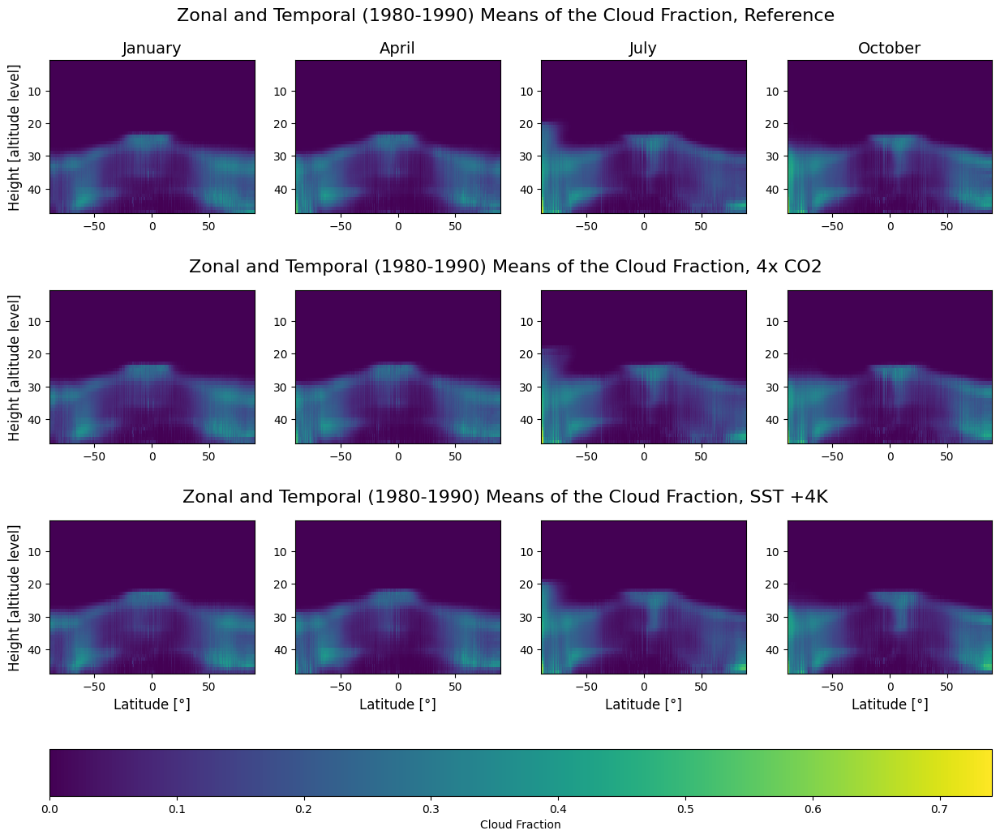

In [139]:
# ---------------------------------------------------------------
# Plot of all three scenarios – cloud fraction
# ---------------------------------------------------------------

arrays3d = [Ref_3D_monthmeans, CO2_3D_monthmeans, SST_3D_monthmeans]
names = ["Reference", "4x CO2", "SST +4K"]
months = ["January", "April", "July", "October"]

fig, ax = plt.subplots(figsize=(15, 12), nrows=3, ncols=4)
fig.subplots_adjust(hspace=0.5)

# For the global colorbar
vmin = min(arr.min().values for arr in arrays3d)
vmax = max(arr.max().values for arr in arrays3d)

for i in range(0,3):
    ax[i][0].set_ylabel("Height [altitude level]", fontsize=12)

    for j in range(0,4):
        pcm = ax[i][j].pcolormesh(
            np.rad2deg(arrays3d[i].isel(month=j*3).clat), arrays3d[i].isel(month=j*3).height, arrays3d[i].isel(month=j*3),
            shading='auto',
            cmap='viridis',
            vmin=vmin,
            vmax=vmax
        )

        ax[i][j].invert_yaxis()

        if i == 0:
            ax[i][j].set_title(months[j], fontsize=14)

        if i == 2:
            ax[i][j].set_xlabel("Latitude [°]", fontsize=12)

fig.colorbar(pcm, ax=ax, orientation='horizontal', label="Cloud Fraction", fraction=0.08, pad=0.1)

fig.text(0.5, 0.92, "Zonal and Temporal (1980-1990) Means of the Cloud Fraction, Reference", ha="center", fontsize=16)
fig.text(0.5, 0.662, "Zonal and Temporal (1980-1990) Means of the Cloud Fraction, 4x CO2", ha="center", fontsize=16)
fig.text(0.5, 0.425, "Zonal and Temporal (1980-1990) Means of the Cloud Fraction, SST +4K", ha="center", fontsize=16)

plt.show()

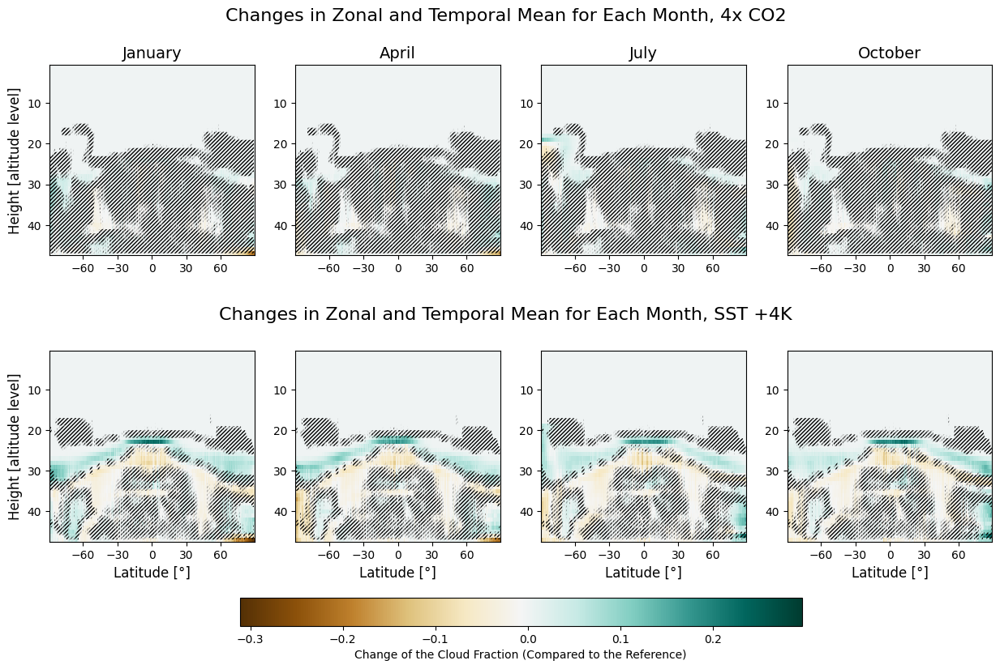

In [140]:
# ---------------------------------------------------------------
# Plot of the differences comparing 4x CO2 and SST +4K to the reference
# ---------------------------------------------------------------

arrays3d = [CO2_3D_monthmeans - Ref_3D_monthmeans, SST_3D_monthmeans - Ref_3D_monthmeans]
names = ["Reference", "4x CO2", "SST +4K"]
months = ["January", "April", "July", "October"]

fig, ax = plt.subplots(figsize=(15, 9), nrows=2, ncols=4)
fig.subplots_adjust(hspace=0.5)

# For the global colorbar
vmin = min(arr.min().values for arr in arrays3d)
vmax = max(arr.max().values for arr in arrays3d)

for i in range(0,2):
    ax[i][0].set_ylabel("Height [altitude level]", fontsize=12)

    for j in range(0,4):
        pcm = ax[i][j].pcolormesh(
            np.rad2deg(arrays3d[i].isel(month=j*3).clat), arrays3d[i].isel(month=j*3).height, arrays3d[i].isel(month=j*3),
            shading='auto',
            cmap='BrBG',
            vmin=vmin,
            vmax=vmax
        )

        ax[i][j].invert_yaxis()
        ax[i][j].set_xticks([-60,-30,0,30,60])

        if i == 0:
            ax[i][j].set_title(months[j], fontsize=14)
            ax[i][j].contourf(np.rad2deg(signal_co2.clat), signal_co2.height, sig_mask_co2, levels=[0.05,1], colors='none', hatches=["///////"])

        if i == 1:
            ax[i][j].set_xlabel("Latitude [°]", fontsize=12)
            ax[i][j].contourf(np.rad2deg(signal_sst.clat), signal_sst.height, sig_mask_sst, levels=[0.05,1], colors='none', hatches=["///////"])

fig.colorbar(pcm, ax=ax, orientation='horizontal', label="Change of the Cloud Fraction (Compared to the Reference)", fraction=0.05, pad=0.1)

fig.text(0.5, 0.94, "Changes in Zonal and Temporal Mean for Each Month, 4x CO2", ha="center", fontsize=16)
fig.text(0.5, 0.53, "Changes in Zonal and Temporal Mean for Each Month, SST +4K", ha="center", fontsize=16)

#plt.savefig("Zonal_SeasonsTemporal_Both.png", dpi=300, bbox_inches="tight")
plt.show()

In [141]:
# ATTENTION: Only run once!
# Calculating the temporal and zonal means grouped by month

# 4x CO2 3D
CO2_3D_yearmeans = CO2_3D.groupby("time.year").mean(dim="time")

cl = CO2_3D_yearmeans["cl"]
CO2_3D_yearmeans_cl = cl.groupby("clat").mean(dim="ncells")

# SST +4K 3D
SST_3D_yearmeans = SST_3D.groupby("time.year").mean(dim="time")

cl = SST_3D_yearmeans["cl"]
SST_3D_yearmeans_cl = cl.groupby("clat").mean(dim="ncells")

# Reference 3D
Ref_3D_yearmeans = Ref_3D.groupby("time.year").mean(dim="time")

cl = Ref_3D_yearmeans["cl"]
Ref_3D_yearmeans_cl = cl.groupby("clat").mean(dim="ncells")

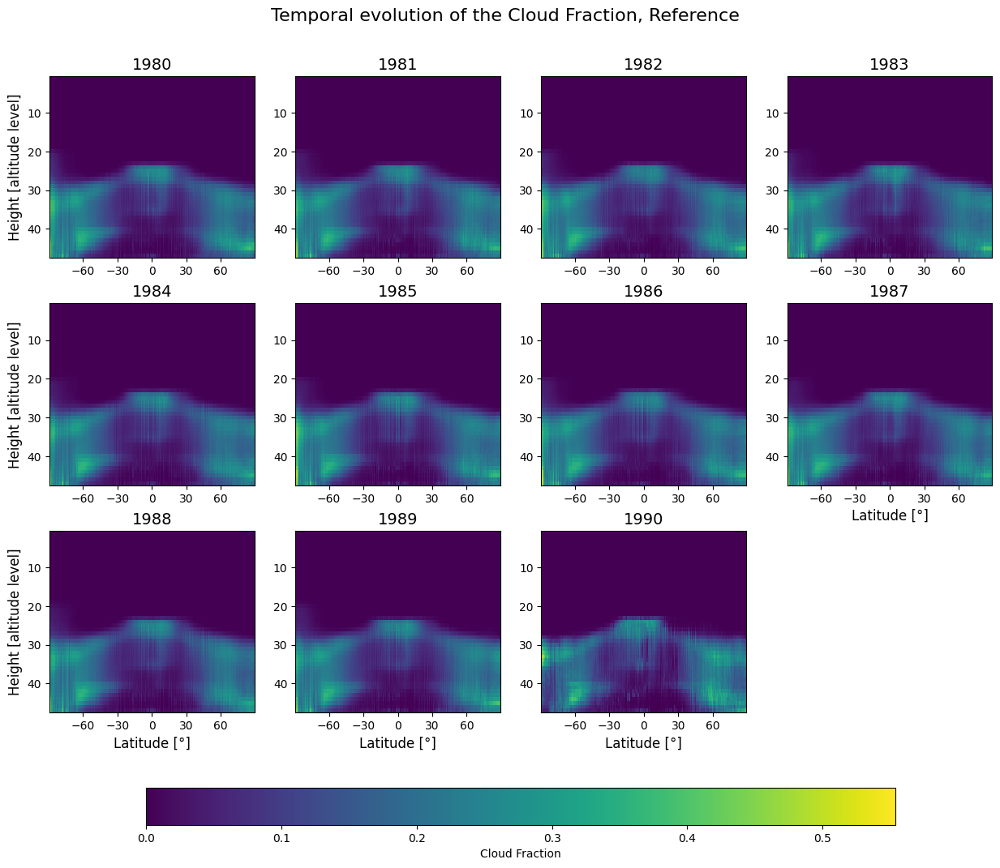

In [142]:
# ---------------------------------------------------------------
# Plot of the temporal evolution – Reference
# ---------------------------------------------------------------

fig, ax = plt.subplots(figsize=(15, 12), nrows=3, ncols=4)
fig.subplots_adjust(hspace=0.25)
ax = ax.flatten()

# For the global colorbar
vmin = Ref_3D_yearmeans_cl.min().values
vmax = Ref_3D_yearmeans_cl.max().values

for i in range(0,11):
    #ax[i].set_ylabel("Height [altitude level]", fontsize=12)


    pcm = ax[i].pcolormesh(
        np.rad2deg(
            Ref_3D_yearmeans_cl.isel(year=i).clat),
            Ref_3D_yearmeans_cl.isel(year=i).height,
            Ref_3D_yearmeans_cl.isel(year=i),
            shading='auto',
            cmap='viridis',
            vmin=vmin,
            vmax=vmax
            )

    ax[i].set_xticks([-60,-30,0,30,60])
    ax[i].invert_yaxis()
    ax[i].set_title(1980+i, fontsize=14)

    #if i == 2:
     #   ax[i][j].set_xlabel("Latitude [°]", fontsize=12)

fig.colorbar(pcm, ax=ax, orientation='horizontal', label="Cloud Fraction", fraction=0.05, pad=0.1)
fig.suptitle("Temporal evolution of the Cloud Fraction, Reference", fontsize=16, y=0.95)

ax[11].axis('off')

for i in [0,4,8]:
    ax[i].set_ylabel("Height [altitude level]", fontsize=12)

for i in [7,8,9,10]:
    ax[i].set_xlabel("Latitude [°]", fontsize=12)

plt.show()

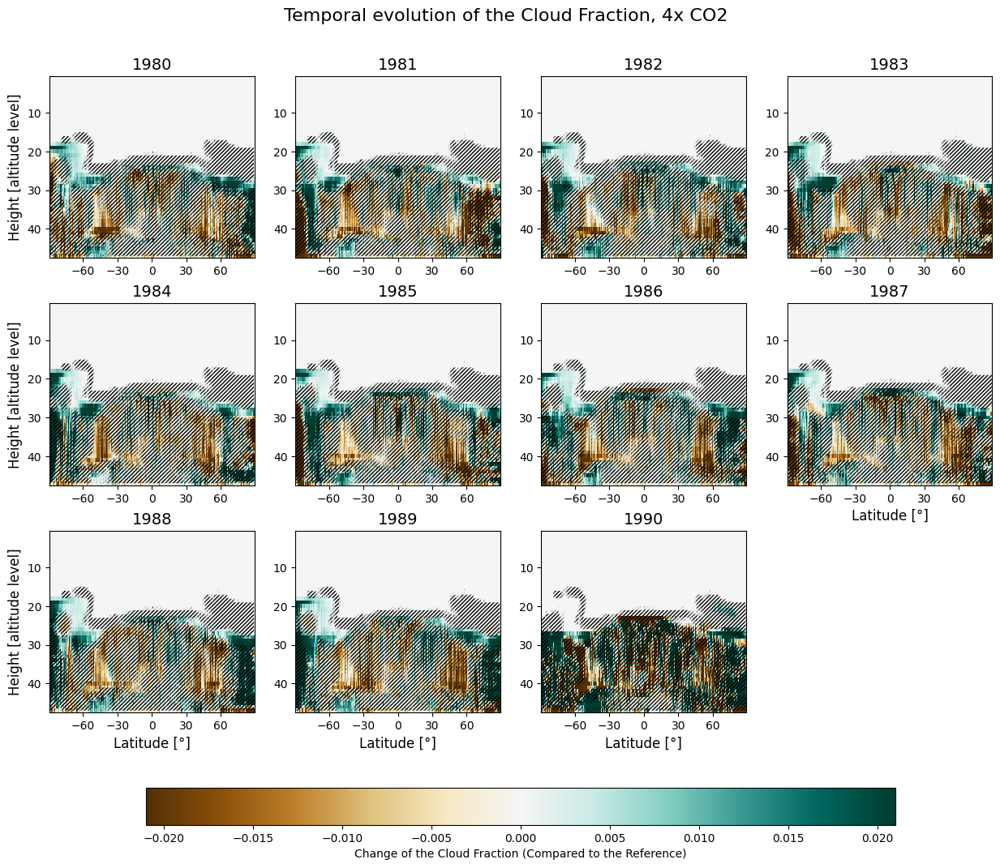

In [143]:
# ---------------------------------------------------------------
# Plot of the temporal evolution – 4x CO2
# ---------------------------------------------------------------

fig, ax = plt.subplots(figsize=(15, 12), nrows=3, ncols=4)
fig.subplots_adjust(hspace=0.25)
ax = ax.flatten()

# For the global colorbar
vmin = CO2_3D_yearmeans_cl.min().values - Ref_3D_yearmeans_cl.min().values
vmax = CO2_3D_yearmeans_cl.max().values - Ref_3D_yearmeans_cl.max().values
norm = TwoSlopeNorm(vmin=-np.max([np.abs(vmin),np.absolute(vmax)]), vcenter=0, vmax=np.max([np.abs(vmin),np.absolute(vmax)]))

for i in range(0,11):
    #ax[i].set_ylabel("Height [altitude level]", fontsize=12)


    pcm = ax[i].pcolormesh(
        np.rad2deg(
            CO2_3D_yearmeans_cl.isel(year=i).clat),
            CO2_3D_yearmeans_cl.isel(year=i).height,
            CO2_3D_yearmeans_cl.isel(year=i) - Ref_3D_yearmeans_cl.isel(year=i),
            shading='auto',
            cmap='BrBG',
            norm=norm,
            )

    ax[i].set_xticks([-60,-30,0,30,60])
    ax[i].invert_yaxis()
    ax[i].set_title(1980+i, fontsize=14)

    ax[i].contourf(np.rad2deg(signal_co2.clat), signal_co2.height, sig_mask_co2, levels=[0.05,1], colors='none', hatches=["///////"])

    #if i == 2:
     #   ax[i][j].set_xlabel("Latitude [°]", fontsize=12)

fig.colorbar(pcm, ax=ax, orientation='horizontal', label="Change of the Cloud Fraction (Compared to the Reference)", fraction=0.05, pad=0.1)
fig.suptitle("Temporal evolution of the Cloud Fraction, 4x CO2", fontsize=16, y=0.95)

ax[11].axis('off')

for i in [0,4,8]:
    ax[i].set_ylabel("Height [altitude level]", fontsize=12)

for i in [7,8,9,10]:
    ax[i].set_xlabel("Latitude [°]", fontsize=12)

#plt.savefig("Zonal_ChangesTemporal_CO2.png", dpi=300, bbox_inches="tight")
plt.show()

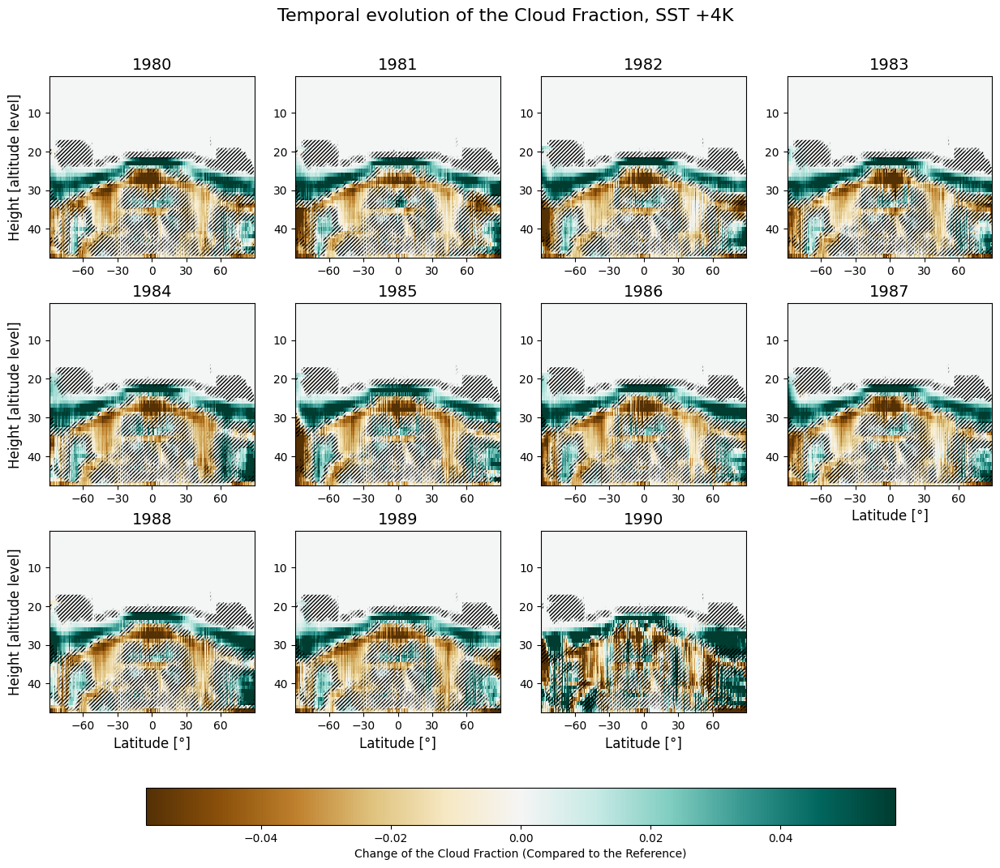

In [144]:
# ---------------------------------------------------------------
# Plot of the temporal evolution – SST +4K
# ---------------------------------------------------------------

fig, ax = plt.subplots(figsize=(15, 12), nrows=3, ncols=4)
fig.subplots_adjust(hspace=0.25)
ax = ax.flatten()

# For the global colorbar
vmin = SST_3D_yearmeans_cl.min().values - Ref_3D_yearmeans_cl.min().values
vmax = SST_3D_yearmeans_cl.max().values - Ref_3D_yearmeans_cl.max().values
norm = TwoSlopeNorm(vmin=-np.max([np.abs(vmin),np.absolute(vmax)]), vcenter=0, vmax=np.max([np.abs(vmin),np.absolute(vmax)]))

for i in range(0,11):
    #ax[i].set_ylabel("Height [altitude level]", fontsize=12)


    pcm = ax[i].pcolormesh(
        np.rad2deg(
            SST_3D_yearmeans_cl.isel(year=i).clat),
            SST_3D_yearmeans_cl.isel(year=i).height,
            SST_3D_yearmeans_cl.isel(year=i) - Ref_3D_yearmeans_cl.isel(year=i),
            shading='auto',
            cmap='BrBG',
            norm=norm,
            )

    ax[i].set_xticks([-60,-30,0,30,60])
    ax[i].invert_yaxis()
    ax[i].set_title(1980+i, fontsize=14)

    ax[i].contourf(np.rad2deg(signal_sst.clat), signal_sst.height, sig_mask_sst, levels=[0.05,1], colors='none', hatches=["///////"])

    #if i == 2:
     #   ax[i][j].set_xlabel("Latitude [°]", fontsize=12)

fig.colorbar(pcm, ax=ax, orientation='horizontal', label="Change of the Cloud Fraction (Compared to the Reference)", fraction=0.05, pad=0.1)
fig.suptitle("Temporal evolution of the Cloud Fraction, SST +4K", fontsize=16, y=0.95)

ax[11].axis('off')

for i in [0,4,8]:
    ax[i].set_ylabel("Height [altitude level]", fontsize=12)

for i in [7,8,9,10]:
    ax[i].set_xlabel("Latitude [°]", fontsize=12)

#plt.savefig("Zonal_ChangesTemporal_SST.png", dpi=300, bbox_inches="tight")
plt.show()

---
# Subtask 2
---

In [145]:
# Calculating the temporal means (including weights) – ONLY CLT

# 4x CO2 3D
month_length = CO2_2D.time.dt.days_in_month
temporal_weights = month_length / month_length.sum()
CO2_2D_temporal_mean = CO2_2D.clt.weighted(temporal_weights).mean(dim="time")
# CO2_3D_temporal_mean.to_netcdf("CO2_3D_temporal_mean.nc")

# SST +4K 3D
month_length = SST_2D.time.dt.days_in_month
temporal_weights = month_length / month_length.sum()
SST_2D_temporal_mean = SST_2D.clt.weighted(temporal_weights).mean(dim="time")
# SST_3D_temporal_mean.to_netcdf("SST_3D_temporal_mean.nc")

# Reference 3D
month_length = Ref_2D.time.dt.days_in_month
temporal_weights = month_length / month_length.sum()
Ref_2D_temporal_mean = Ref_2D.clt.weighted(temporal_weights).mean(dim="time")
# Ref_3D_temporal_mean.to_netcdf("Ref_3D_temporal_mean.nc")

In [148]:
# ---------------------------------------------------------------
# Only ttest
# ---------------------------------------------------------------

def weighted_annual_mean(ds):
    month_length = ds.time.dt.days_in_month
    weighted_sum = (ds * month_length).groupby("time.year").sum("time")
    normalization = month_length.groupby("time.year").sum("time")
    return weighted_sum / normalization

ttest_CO2_2D_ann = weighted_annual_mean(CO2_2D.clt)
ttest_SST_2D_ann = weighted_annual_mean(SST_2D.clt)
ttest_Ref_2D_ann = weighted_annual_mean(Ref_2D.clt)

dCO2 = ttest_CO2_2D_ann - ttest_Ref_2D_ann
dSST = ttest_SST_2D_ann - ttest_Ref_2D_ann

tval_co2, pval_co2 = ttest_1samp(dCO2, popmean=0, axis=0)
tval_sst, pval_sst = ttest_1samp(dSST, popmean=0, axis=0)


# Adding the coordinates again
pval_co2_da = xr.DataArray(
    pval_co2,
    dims=dCO2.isel(year=0).dims,
    coords=dCO2.isel(year=0).coords,
    name="pval_co2"
)

pval_sst_da = xr.DataArray(
    pval_sst,
    dims=dSST.isel(year=0).dims,
    coords=dSST.isel(year=0).coords,
    name="pval_sst"
)

# ------
#signal_co2_2d = dCO2.mean(dim="year")
sig_mask_co2 = pval_co2_da >= 0.05

#signal_sst_2d = dSST.mean(dim="year")
sig_mask_sst = pval_sst_da >= 0.05

In [149]:
vmin = min((CO2_2D_temporal_mean - Ref_2D_temporal_mean).min(), (SST_2D_temporal_mean - Ref_2D_temporal_mean).min())
vmax = max((CO2_2D_temporal_mean - Ref_2D_temporal_mean).max(), (SST_2D_temporal_mean - Ref_2D_temporal_mean).max())
norm = TwoSlopeNorm(vmin=-np.max([np.abs(vmin),np.absolute(vmax)]), vcenter=0, vmax=np.max([np.abs(vmin),np.absolute(vmax)]))

def plot_icon_map(data,mask,name,colbar,cmap,savename):
    lon = np.rad2deg(data.clon.values)
    lat = np.rad2deg(data.clat.values)
    values = data.values

    fig = plt.figure(figsize=(12,7))
    ax = plt.axes(projection=ccrs.Mollweide())
    ax.set_global()
    ax.coastlines(resolution="110m", linewidth=1)

    sc = ax.scatter(
        lon, lat,
        c=values,
        s=18,
        cmap=cmap,
        transform=ccrs.PlateCarree(),
        norm=norm
    )

    mask_bool = mask.values

    ax.scatter(
        lon[mask_bool],
        lat[mask_bool],
        facecolors="none",
        edgecolors="k",
        linewidths=0.1,
        c="black",
        s=2,
        transform=ccrs.PlateCarree()
    )

    plt.colorbar(
        sc, ax=ax, orientation='horizontal', pad=0.05, aspect=40,
        label=colbar
    )

    ax.set_title(name)
    plt.savefig(savename + ".png", dpi=300, bbox_inches="tight")
    plt.show()

/Users/eliasertschnig/Desktop/Uni/Meteorologie/.venv/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1677: UserWarning: You passed both c and facecolor/facecolors for the markers. c has precedence over facecolor/facecolors. This behavior may change in the future.
  result = super().scatter(*args, **kwargs)


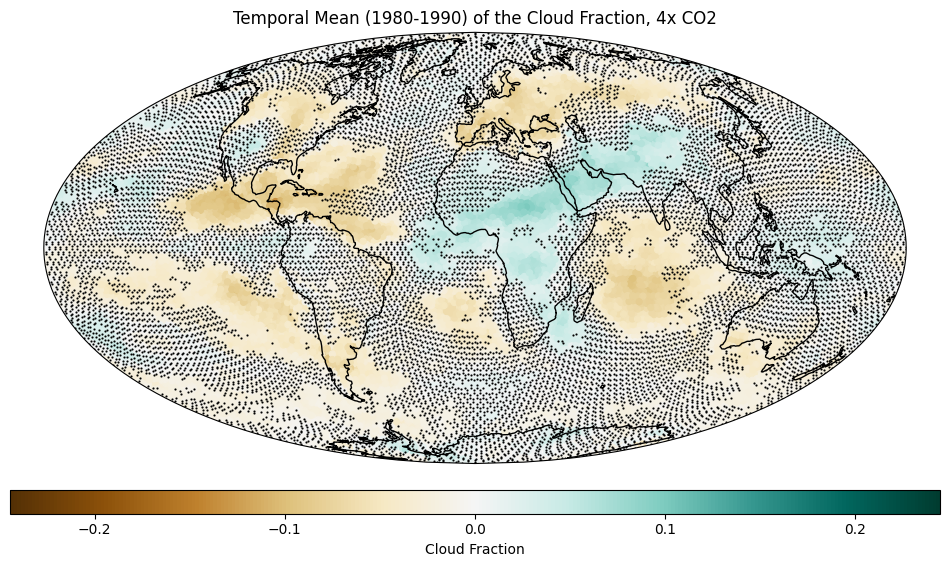

In [150]:
plot_icon_map(CO2_2D_temporal_mean-Ref_2D_temporal_mean,sig_mask_co2,"Temporal Mean (1980-1990) of the Cloud Fraction, 4x CO2","Cloud Fraction","BrBG","clt4xCO2")

/Users/eliasertschnig/Desktop/Uni/Meteorologie/.venv/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1677: UserWarning: You passed both c and facecolor/facecolors for the markers. c has precedence over facecolor/facecolors. This behavior may change in the future.
  result = super().scatter(*args, **kwargs)


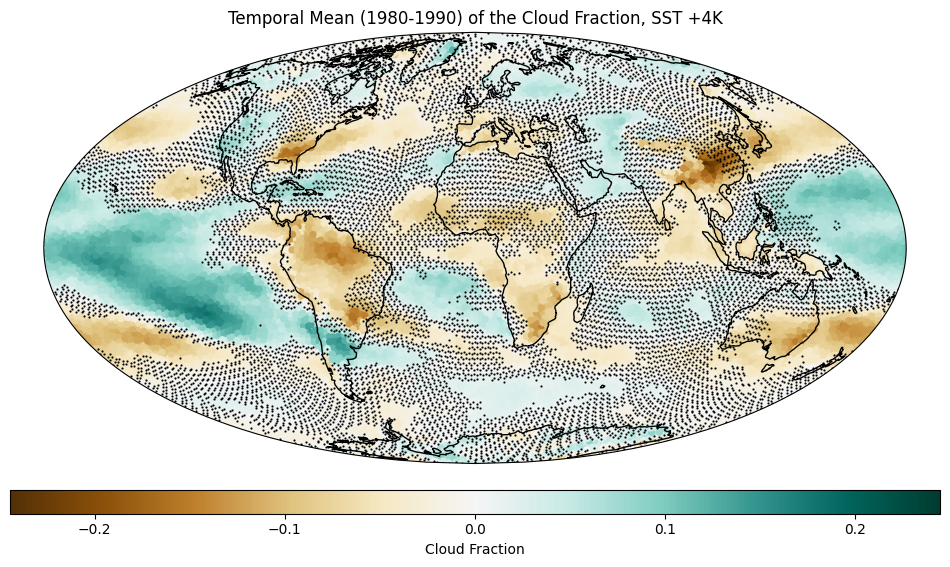

In [151]:
plot_icon_map(SST_2D_temporal_mean-Ref_2D_temporal_mean,sig_mask_sst,"Temporal Mean (1980-1990) of the Cloud Fraction, SST +4K","Cloud Fraction","BrBG","cltSST4K")

In [195]:
# All the Means (Grouped by month & years)

# 4x CO2
CO2_2D_monthmeans = CO2_2D.clt.groupby("time.month").mean(dim="time")
CO2_2D_yearmeans = CO2_2D.clt.groupby("time.year").mean(dim="time")

# SST +4K
SST_2D_monthmeans = SST_2D.clt.groupby("time.month").mean(dim="time")
SST_2D_yearmeans = SST_2D.clt.groupby("time.year").mean(dim="time")

# Reference
Ref_2D_monthmeans = Ref_2D.clt.groupby("time.month").mean(dim="time")
Ref_2D_yearmeans = Ref_2D.clt.groupby("time.year").mean(dim="time")

/Users/eliasertschnig/Desktop/Uni/Meteorologie/.venv/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1677: UserWarning: You passed both c and facecolor/facecolors for the markers. c has precedence over facecolor/facecolors. This behavior may change in the future.
  result = super().scatter(*args, **kwargs)


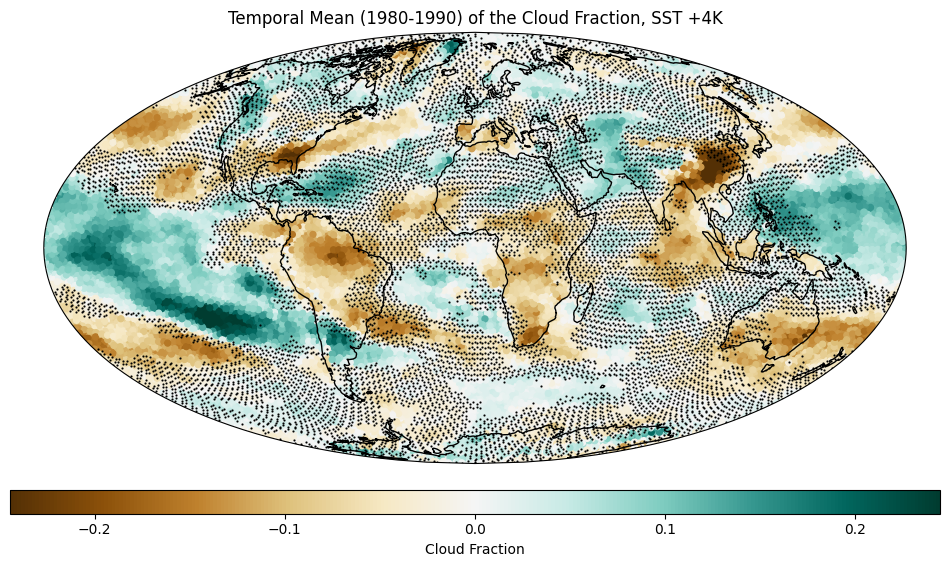

In [158]:
# Just some testing

plot_icon_map(SST_2D_yearmeans.isel(year=0)-Ref_2D_yearmeans.isel(year=0),sig_mask_sst,"Temporal Mean (1980-1990) of the Cloud Fraction, SST +4K","Cloud Fraction","BrBG","cltSST4K")

In [191]:
# Function adjusted to be able to plot within subplots

def plot_icon_map_ax(data, mask, ax, name, colbar, cmap, norm=None):
    """
    Plotten auf einer vorhandenen Achse `ax` für Subplots.
    """
    lon = np.rad2deg(data.clon.values)
    lat = np.rad2deg(data.clat.values)
    values = data.values

    # Hauptwerte
    sc = ax.scatter(
        lon, lat,
        c=values,
        s=18,
        cmap=cmap,
        transform=ccrs.PlateCarree(),
        norm=norm
    )

    # Signifikanzpunkte
    mask_bool = mask.values
    ax.scatter(
        lon[mask_bool],
        lat[mask_bool],
        facecolors="none",
        edgecolors="k",
        linewidths=0.1,
        s=2,
        transform=ccrs.PlateCarree()
    )

    ax.coastlines(resolution="110m", linewidth=1)
    ax.set_global()
    ax.set_title(name, fontsize=20)

    return sc  # Für colorbar


/var/folders/sv/hf_x6xg154d4gyqx2v4v6wbr0000gn/T/ipykernel_55370/3145138647.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


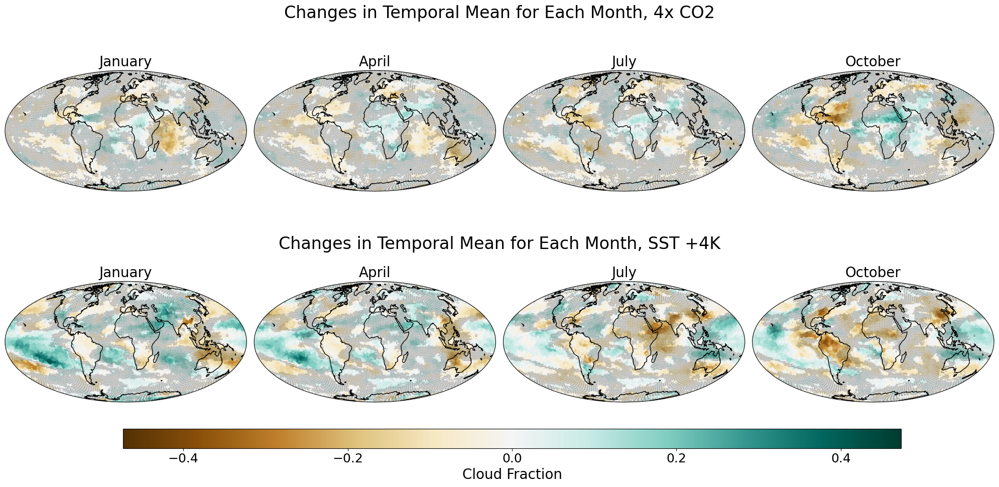

In [200]:
# ---------------------------------------------------------------
# Plot of the differences comparing 4x CO2 and SST +4K to the reference
# ---------------------------------------------------------------

arrays3d = [CO2_2D_monthmeans - Ref_2D_monthmeans, SST_2D_monthmeans - Ref_2D_monthmeans]
names = ["Reference", "4x CO2", "SST +4K"]
months = ["January", "April", "July", "October"]

# For the global colorbar
vmin = min(arr.min().values for arr in arrays3d)
vmax = max(arr.max().values for arr in arrays3d)
norm = TwoSlopeNorm(vmin=-max(abs(vmin), abs(vmax)), vcenter=0, vmax=max(abs(vmin), abs(vmax)))

fig, axs = plt.subplots(2, 4, figsize=(20, 10),
                        subplot_kw={"projection": ccrs.Mollweide()})

for i in range(2):
    if i == 0:
        for j in range(4):
            sc = plot_icon_map_ax(
                data=arrays3d[i].isel(month=j*3),
                mask=sig_mask_co2,
                ax=axs[i, j],
                name=f"{months[j]}",
                colbar="Cloud Fraction",
                cmap="BrBG",
                norm=norm
            )
    elif i == 1:
        for j in range(4):
            sc = plot_icon_map_ax(
                data=arrays3d[i].isel(month=j*3),
                mask=sig_mask_sst,
                ax=axs[i, j],
                name=f"{months[j]}",
                colbar="Cloud Fraction",
                cmap="BrBG",
                norm=norm
            )

plt.subplots_adjust(bottom=-0.2)
cbar = fig.colorbar(sc, ax=axs, orientation="horizontal", pad=0.1, aspect=40)
cbar.set_label("Cloud Fraction", fontsize=20)
cbar.ax.tick_params(labelsize=18)

fig.text(0.5, 0.78, "Changes in Temporal Mean for Each Month, 4x CO2", ha="center", fontsize=24)
fig.text(0.5, 0.32, "Changes in Temporal Mean for Each Month, SST +4K", ha="center", fontsize=24)

plt.tight_layout()
#plt.savefig("Global_SeasonsTemporal_Both.png", dpi=300, bbox_inches="tight")
plt.show()

/var/folders/sv/hf_x6xg154d4gyqx2v4v6wbr0000gn/T/ipykernel_55370/3559389125.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


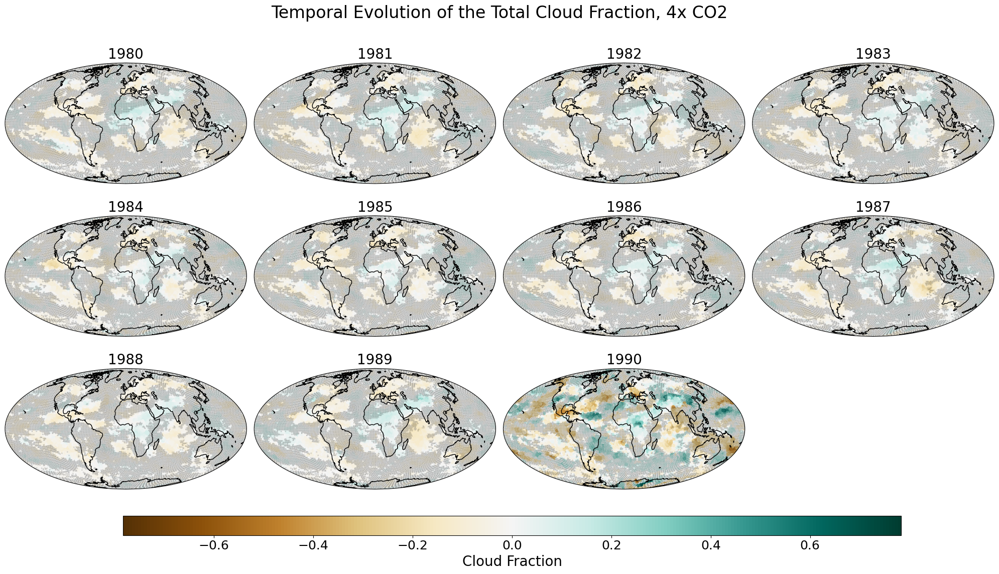

In [207]:
# ---------------------------------------------------------------
# Plot of the differences comparing 4x CO2 and SST +4K to the reference
# ---------------------------------------------------------------

arrays3d = [CO2_2D_yearmeans - Ref_2D_yearmeans, SST_2D_yearmeans - Ref_2D_yearmeans]
names = ["Reference", "4x CO2", "SST +4K"]
months = ["January", "April", "July", "October"]

# For the global colorbar
vmin = min(arr.min().values for arr in arrays3d)
vmax = max(arr.max().values for arr in arrays3d)
norm = TwoSlopeNorm(vmin=-max(abs(vmin), abs(vmax)), vcenter=0, vmax=max(abs(vmin), abs(vmax)))

fig, axs = plt.subplots(3, 4, figsize=(20, 10),
                        subplot_kw={"projection": ccrs.Mollweide()})

axs=axs.flatten()

for i in range(11):
        sc = plot_icon_map_ax(
            data=arrays3d[0].isel(year=i),
            mask=sig_mask_co2,
            ax=axs[i],
            name=1980+i,
            colbar="Cloud Fraction",
            cmap="BrBG",
            norm=norm
        )


axs[11].axis('off')

plt.subplots_adjust(bottom=-0.2)
cbar = fig.colorbar(sc, ax=axs, orientation="horizontal", pad=0.1, aspect=40)
cbar.set_label("Cloud Fraction", fontsize=20)
cbar.ax.tick_params(labelsize=18)

fig.suptitle("Temporal Evolution of the Total Cloud Fraction, 4x CO2", ha="center", fontsize=24)

plt.tight_layout()
#plt.savefig("Global_YearTemporal_4xCO2.png", dpi=300, bbox_inches="tight")
plt.show()

/var/folders/sv/hf_x6xg154d4gyqx2v4v6wbr0000gn/T/ipykernel_55370/1438308089.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


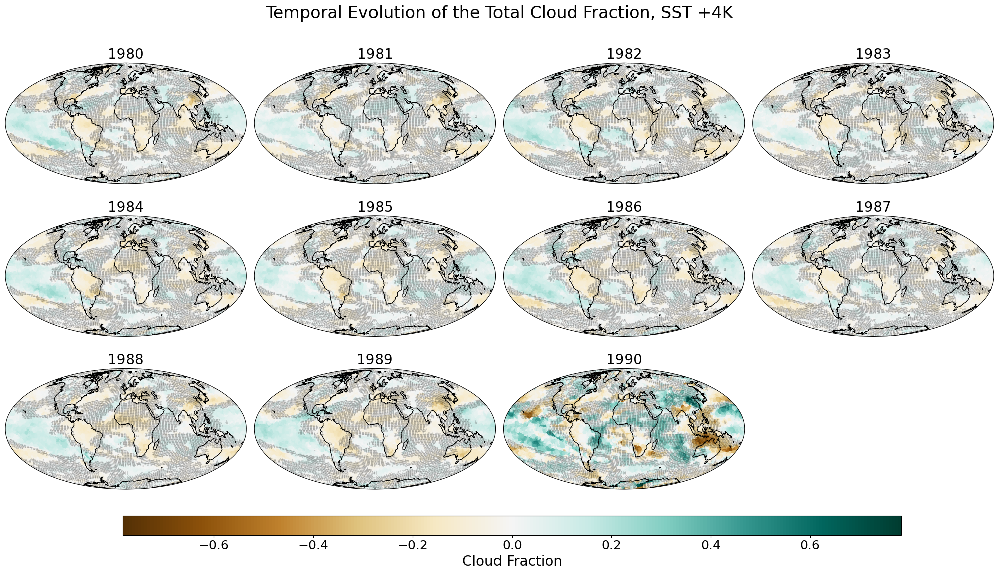

In [208]:
# ---------------------------------------------------------------
# Plot of the differences comparing 4x CO2 and SST +4K to the reference
# ---------------------------------------------------------------

arrays3d = [CO2_2D_yearmeans - Ref_2D_yearmeans, SST_2D_yearmeans - Ref_2D_yearmeans]
names = ["Reference", "4x CO2", "SST +4K"]
months = ["January", "April", "July", "October"]

# For the global colorbar
vmin = min(arr.min().values for arr in arrays3d)
vmax = max(arr.max().values for arr in arrays3d)
norm = TwoSlopeNorm(vmin=-max(abs(vmin), abs(vmax)), vcenter=0, vmax=max(abs(vmin), abs(vmax)))

fig, axs = plt.subplots(3, 4, figsize=(20, 10),
                        subplot_kw={"projection": ccrs.Mollweide()})

axs=axs.flatten()

for i in range(11):
        sc = plot_icon_map_ax(
            data=arrays3d[1].isel(year=i),
            mask=sig_mask_sst,
            ax=axs[i],
            name=1980+i,
            colbar="Cloud Fraction",
            cmap="BrBG",
            norm=norm
        )


axs[11].axis('off')

plt.subplots_adjust(bottom=-0.2)
cbar = fig.colorbar(sc, ax=axs, orientation="horizontal", pad=0.1, aspect=40)
cbar.set_label("Cloud Fraction", fontsize=20)
cbar.ax.tick_params(labelsize=18)

fig.suptitle("Temporal Evolution of the Total Cloud Fraction, SST +4K", ha="center", fontsize=24)

plt.tight_layout()
#plt.savefig("Global_YearTemporal_SST4K.png", dpi=300, bbox_inches="tight")
plt.show()